<table>
<tr>    
<td>
<img src="http://home.agh.edu.pl/~horzyk/im/AdrianHorzyk140h.png" alt="Adrian Horzyk, Professor" title="Adrian Horzyk, Professor" />        
</td> 
<td style="text-align: center">
<h1>Introduction to Convolutional Neural Networks</h1>
<h2><a href="http://home.agh.edu.pl/~horzyk/index-eng.php">Adrian Horzyk</a></h2>
<h3>Welcome to the interactive lecture where you can check everything by yourself and experiment!</h3>
</td> 
</tr>
</table>

# Convolutional Neural Networks

became very popular because they can efficiently deal with many problems, especially with images that can be correctly recognized or classified independently of the movements of objects in the vision area, which was a big limitations of MLP networks (Dense layers only). 

Convolutional Neural Networks (CNN) can hierarchically extract important subpatterns, which are used to define high-order features that allow dense layers to classify input images with more ease and accuracy.

Now, we will try to train such networks to MNIST dataset to check whether we can achieve better performance and accuracy of the CNN-based models in comparison to the previous MLP (dense layers only) models.

In [1]:
'''Trains a simple ConvNet on the MNIST dataset. It gets over 99.6% validation accuracy after ~50 epochs
(but there is still a margin for hyperparameter tuning). Training can take an hour or so!'''

# Import libraries
from __future__ import print_function
import numpy as np
import math
from math import ceil
import tensorflow as tf
import os   
import seaborn as sns
import matplotlib.pyplot as plt  # library for plotting math functions
import pandas as pd
import keras   # Import keras framework with various functions, models and structures
from keras.datasets import mnist # gets MNIST dataset from repository
from keras import layers
from keras import models
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras import optimizers
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from keras.datasets import mnist
from keras.utils import to_categorical
from keras import regularizers

# Set parameters for plots
%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

print ("TensorFlow version: " + tf.__version__)
print ("Keras version:" + keras.__version__)

TensorFlow version: 2.4.1
Keras version:2.4.3


### Create or choose directory for storing trained models.

In [4]:
# The path to the directory for storing and loading our models
models_dir = 'models/'
if not os.path.exists(models_dir):
    os.mkdir(models_dir)
    
# The path to the directory where the dataset are stored
original_dataset_dir = 'http://horzyk.pl/ml/data/kaggle/original/train'
#original_dataset_dir = 'C:/Users/Adria/ml/data/kaggle/original/train'

In [5]:
# Split the data between train and validation sets. Here we are using only two sets for model training and validation.
(x_train, y_train), (x_val, y_val) = mnist.load_data() # 60000 training and 10000 validating examples

# Number of training and val data
num_train_data = x_train.shape[0]
num_val_data = x_val.shape[0]

# Input image dimensions
img_rows, img_cols = x_train.shape[1], x_train.shape[2]

num_classes = np.size(np.unique(y_train))    # number of unique labels = number of classes of digits: 0, 1, 2, ..., 9
print ('Number of classes: ', num_classes)

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers training data of various classes: ', np.unique(y_train, return_counts=True))

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers validation data of various classes: ', np.unique(y_val, return_counts=True))

Number of classes:  10
Distribution of the numbers training data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([5923, 6742, 5958, 6131, 5842, 5421, 5918, 6265, 5851, 5949],
      dtype=int64))
Distribution of the numbers validation data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([ 980, 1135, 1032, 1010,  982,  892,  958, 1028,  974, 1009],
      dtype=int64))


A few examples of the MNIST data:

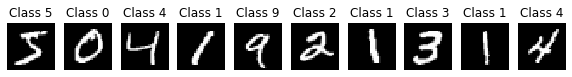

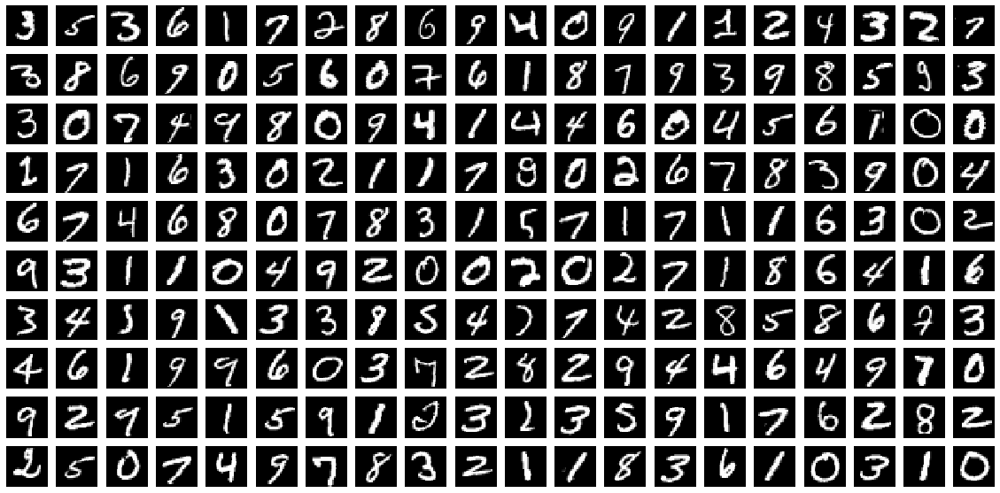

In [6]:
# Show a few sample digits from the training set
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()

# Show a few sample digits from the training set
plt.rcParams['figure.figsize'] = (1.0, 1.0) # set default size of plots
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

Reshape and transform the data to the expected types and ranges:

In [7]:
# According to the different formats reshape training and validation data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255   # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255    # Transfrom the validation data from the range of 0 and 255 to the range of 0 and 1

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validation samples')

# Convert class vectors (integers) to binary class matrices using as specific 
y_train = keras.utils.to_categorical(y_train, num_classes) # y_train - a converted class vector into a matrix (integers from 0 to num_classes)
y_val = keras.utils.to_categorical(y_val, num_classes) # y_val - a converted class vector into a matrix (integers from 0 to num_classes)

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 validation samples


## Introduction to ConvNets

First, let's take a look at a very simple convnet example. We will use a convnet to classify MNIST digits, a task that you've already been that we already mentioned and achieved the validation accuracy ~98%). Even though our first convnet will be very basic, its accuracy will outperform the previous densely-connected model.

To construct a basic convnet, we use a small stack of `Conv2D` and `MaxPooling2D` layers.

This convnet takes as input tensors of shape `(image_height, image_width, image_channels)` (not including the batch dimension). We will configure our convnet to process inputs of size `(28, 28, 1)` via passing the argument `input_shape=(28, 28, 1)` to our first layer.

In [8]:
# A simple CONVNET model for MNIST data
model1 = models.Sequential()
model1.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_rows, img_cols, 1)))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
# Flatten the output to input data to the Dense layer
model1.add(layers.Flatten())
# Dense layers - similar to the previous model, but using the smaller number of units
model1.add(layers.Dense(64, activation='relu'))
model1.add(layers.Dense(num_classes, activation='softmax'))

model1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 576)               0         
_________________________________________________________________
dense (Dense)                (None, 64)                3

You can notice that the output of every `Conv2D` and `MaxPooling2D` layer is a 3D tensor of shape `(height, width, channels)`. The width and height dimensions tend to shrink as we go deeper in the network. The number of channels is controlled by the first argument (hyperparameter) passed to the `Conv2D` layers (e.g., 32 or 64), and it is set by the developer (i.e., it is not automatically optimized by the model).

The next step would be to feed our last output tensor (of shape `(3, 3, 64)`) into a densely-connected classifier network like those you are already familiar with - a stack of `Dense` layers, but the dense classifiers require a vector (1D tensor) on its input, so we must flatten our 3D outputs to 1D first, and then add a few `Dense` layers.

As you can see, our `(3, 3, 64)` outputs were flattened into vectors of shape `(576,)`, before going through two `Dense` layers.

Let's notice that our previous dense-based model had about 4 times more parameters (weights) that the above convnet model!

Now, let's train our convnet on the MNIST digits and compare results:

In [9]:
# Set up the basic hyperparameters
epochs = 50       # the number of training epochs
batch_size = 256  # the size of mini-batches used for training the network in one step

#early_stopping = EarlyStopping(monitor='val_loss', patience=2)
#model.fit(x, y, validation_split=0.2, callbacks=[early_stopping])

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

# Save weights of the model before training to enable to start training it again
model1.save_weights(models_dir + 'CNN_MNIST_1_weights_init.h5')

history1 = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size, validation_data=(x_val, y_val))

Epoch 1/50
235/235 [==============================] - 33s 128ms/step - loss: 0.6960 - acc: 0.7793 - val_loss: 0.0674 - val_acc: 0.9792
Epoch 2/50
235/235 [==============================] - 30s 127ms/step - loss: 0.0815 - acc: 0.9743 - val_loss: 0.0572 - val_acc: 0.9802
Epoch 3/50
235/235 [==============================] - 30s 127ms/step - loss: 0.0490 - acc: 0.9855 - val_loss: 0.0549 - val_acc: 0.9825
Epoch 4/50
235/235 [==============================] - 31s 130ms/step - loss: 0.0335 - acc: 0.9894 - val_loss: 0.0360 - val_acc: 0.9890
Epoch 5/50
235/235 [==============================] - 29s 123ms/step - loss: 0.0273 - acc: 0.9915 - val_loss: 0.0487 - val_acc: 0.9840
Epoch 6/50
235/235 [==============================] - 29s 122ms/step - loss: 0.0210 - acc: 0.9936 - val_loss: 0.0304 - val_acc: 0.9903
Epoch 7/50
235/235 [==============================] - 30s 127ms/step - loss: 0.0176 - acc: 0.9943 - val_loss: 0.0229 - val_acc: 0.9926
Epoch 8/50
235/235 [==============================] - 3

In [10]:
### Save the trained model for future use or comparisons

In [11]:
model1.save(models_dir + 'CNN_MNIST_1b.h5')

In [12]:
# Evaluate the model and print out the final scores for the validation set
val_loss1, val_acc1 = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1)
print('validation loss:', val_loss1)

313/313 [==============================] - 2s 6ms/step - loss: 0.0790 - acc: 0.9912
validation accuracy: 0.9911999702453613
validation loss: 0.07902918756008148


We can notice that the training of convnet takes much longer time that for our dense-base network; however the achieved results on the validation set is much better. Now, we achieved ~99.3% instaed of ~98% after the same number of training epochs, using four times less parameters.

In [13]:
argmax = np.argmax(history1.history['val_acc'])
acc_max = history1.history['val_acc'][argmax]
print ('The best accuracy ', acc_max, ' for validation set we achieved in epoch: ', argmax)

The best accuracy  0.9932000041007996  for validation set we achieved in epoch:  23


In [14]:
argmin = np.argmin(history1.history['val_loss'])
loss_min = history1.history['val_loss'][argmin]
print ('Overfitting stated after epoch: ', argmin, 'where the mininum loss was ', loss_min)

Overfitting stated after epoch:  6 where the mininum loss was  0.02289673499763012


In [15]:
# Set the number of training epochs to this value to stop training before overfitting and results on the validation set
epochs = argmin       # the number of training epochs
# and restart the training process again for this number of epochs:

In [16]:
#model1.load_model(model_dir + 'CNN_MNIST_1a.h5')   # open the model which was saved before the start of its training
model1.load_weights(models_dir + 'CNN_MNIST_1_weights_init.h5')

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

history1b = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size)

Epoch 1/6
235/235 [==============================] - 30s 125ms/step - loss: 0.7068 - acc: 0.7701
Epoch 2/6
235/235 [==============================] - 29s 123ms/step - loss: 0.0833 - acc: 0.9736
Epoch 3/6
235/235 [==============================] - 29s 124ms/step - loss: 0.0474 - acc: 0.9855
Epoch 4/6
235/235 [==============================] - 30s 128ms/step - loss: 0.0356 - acc: 0.9883
Epoch 5/6
235/235 [==============================] - 29s 124ms/step - loss: 0.0269 - acc: 0.9915
Epoch 6/6
235/235 [==============================] - 29s 125ms/step - loss: 0.0208 - acc: 0.9932


In [17]:
model1.save(models_dir + 'CNN_MNIST_1c.h5')

In [18]:
# Evaluate the model and print out the final scores for the validation set
val_loss1b, val_acc1b = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1b)
print('validation loss:', val_loss1b)

313/313 [==============================] - 2s 6ms/step - loss: 0.0382 - acc: 0.9871
validation accuracy: 0.9871000051498413
validation loss: 0.03816872462630272


In the next steps, we should try to modify our ConvNet to achieve event better results. 

## Advanced ConvNet for MNIST Data

First, we construct a deeper ConvNet with Dropout layers and use regularization.

Next, we use training data augmentation and learning rate value control and adaptation.

## Create the network structure

In [19]:
from keras import regularizers

# Define the sequential Keras model composed of a few layers
model2 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model2.add(Conv2D(filters=32, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
# model2.add(Conv2D(32, (3, 3), activation='relu')) - shoter way of the above code
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.20)) # Implements the drop out with the probability of 0.20
model2.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))
model2.add(Conv2D(128,(3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.30))
model2.add(Conv2D(256,(3, 3), activation='relu',padding='same'))
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.40))
model2.add(Conv2D(512,(3, 3), activation='relu',padding='same'))
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.50))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model2.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model2.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.001)))
model2.add(Dropout(0.35))
model2.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.001)))
model2.add(Dropout(0.25))
model2.add(Dense(num_classes, activation='softmax'))

# Now print the full model, which will include the layers of the base model plus the dense layer we added
print(model2.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 6, 6, 128)        

## Compile and train the network

In [ ]:
# Define hyperparameters
epochs = 50       # the number of training epochs
batch_size = 256  # the size of mini-batches used for training the network in one step

# Choose the optimizer that will be used: https://keras.io/api/optimizers/
opt = optimizers.Adam(lr=0.001) #, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam") # https://keras.io/api/optimizers/adam/
#opt = optimizers.Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta", **kwargs)  # https://keras.io/api/optimizers/adadelta/
#opt = optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07, name="Adagrad", **kwargs)  # https://keras.io/api/optimizers/adagrad/
#opt = optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax", **kwargs)  # https://keras.io/api/optimizers/adamax/
#opt = optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam", **kwargs)  # https://keras.io/api/optimizers/Nadam/
#opt = optimizers.Ftrl(learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0, beta=0.0, **kwargs)  # https://keras.io/api/optimizers/ftrl/
#opt = optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop", **kwargs) # https://keras.io/api/optimizers/rmsprop/
#opt = optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD", **kwargs)  # https://keras.io/api/optimizers/sgd/

# Compile the model using optimizer and the chosen metric: sparse_categorical_crossentropy or categorical_crossentropy etc.
model2.compile(loss=keras.losses.categorical_crossentropy, # choose the metric: https://keras.io/api/metrics/
              optimizer=opt,  # choose the optimizer
              metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction during the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
         factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
         patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
         verbose=1,  # 0: quiet, 1: update messages.
         min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
        rotation_range=10, # rotate images in degrees up to the given degrees
        zoom_range=0.2, # zoom images
        width_shift_range=0.15,  # shift images horizontally
        height_shift_range=0.15)  # shift images vertically
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train) # Fits the data generator to the sample data x_train.

# Simple train the model, validate, evaluate, and present scores
'''history = model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,  # no of training epochs
          verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
          validation_data=(x_val, y_val),
          validation_split=0.2,  # cross-validation split 1/5
          shuffle=True) # method of how to shuffle training and validation data '''

# Advanced train the model, validate, evaluate, and present scores: https://keras.io/models/model/#fit_generator
history2 = model2.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,  # no of training epochs
                            steps_per_epoch=x_train.shape[0]//batch_size, # no of mini-batches
                            validation_data=(x_val, y_val),
                            verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
                            callbacks=[learning_rate_reduction])

E:\ANACONDA\lib\site-packages\tensorflow\python\keras\engine\training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/50
234/234 [==============================] - 333s 1s/step - loss: 4.9879 - acc: 0.2887 - val_loss: 0.6568 - val_acc: 0.9503
Epoch 2/50
234/234 [==============================] - 272s 1s/step - loss: 0.9022 - acc: 0.8658 - val_loss: 0.4332 - val_acc: 0.9735
Epoch 3/50
234/234 [==============================] - 252s 1s/step - loss: 0.6236 - acc: 0.9203 - val_loss: 0.3572 - val_acc: 0.9821
Epoch 4/50
234/234 [==============================] - 250s 1s/step - loss: 0.5155 - acc: 0.9403 - val_loss: 0.3192 - val_acc: 0.9844
Epoch 5/50
234/234 [==============================] - 250s 1s/step - loss: 0.4632 - acc: 0.9478 - val_loss: 0.3064 - val_acc: 0.9872
Epoch 6/50
234/234 [==============================] - 252s 1s/step - loss: 0.4295 - acc: 0.9556 - val_loss: 0.2837 - val_acc: 0.9880
Epoch 7/50
234/234 [==============================] - 251s 1s/step - loss: 0.3994 - acc: 0.9599 - val_loss: 0.2856 - val_acc: 0.9900
Epoch 8/50
234/234 [==============================] - 248s 1s/step - 

In [19]:
### Save the trained model for future use or comparisons

In [20]:
model2.save(models_dir + 'CNN_MNIST_2.h5')

## Evaluate, score and plot the accuracy and the loss

In [21]:
import matplotlib.pyplot as plt  # library for plotting math functions: https://matplotlib.org/stable/index.html
    
def PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(acc1))
    plt.plot(epochs, acc1, 'bo', label='Training accuracy for ' + lab1)
    plt.plot(epochs, val_acc1, 'b', label='Validation accuracy for ' + lab1)
    plt.plot(epochs, acc2, 'ro', label='Training accuracy for ' + lab2)
    plt.plot(epochs, val_acc2, 'r', label='Validation accuracy for ' + lab2)
    plt.title('Comparison of Training and Validation Accuracies')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(['Train Acc 1', 'Val Acc 1', 'Train Acc 2', 'Val Acc 2'], loc='lower right')
    plt.show()
    
def PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(loss1))
    plt.plot(epochs, loss1, 'bo', label='Training loss for ' + lab1)
    plt.plot(epochs, val_loss1, 'b', label='Validation loss for ' + lab1)
    plt.plot(epochs, loss2, 'ro', label='Training loss for ' + lab2)
    plt.plot(epochs, val_loss2, 'r', label='Validation loss for ' + lab2)
    plt.title('Comparison of Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(['Train Loss 1', 'Val Loss 1', 'Train Loss 2', 'Val Loss 2'], loc='upper right')
    plt.show()

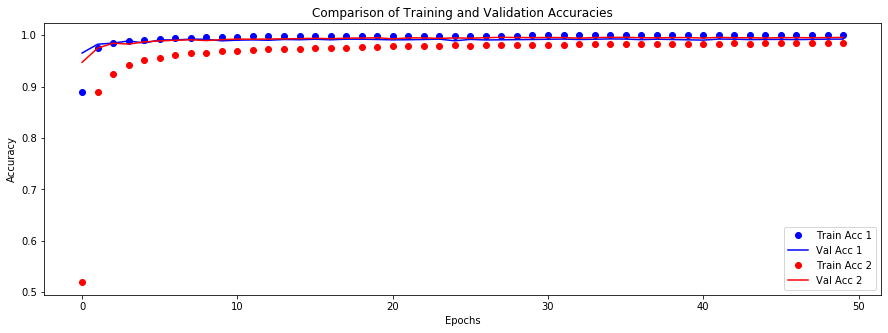

In [22]:
# Compare the accuracies of three training processes
acc1 = history1.history['acc']
val_acc1 = history1.history['val_acc']
acc2 = history2.history['acc']
val_acc2 = history2.history['val_acc']

PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, 'Model 1', 'Model 2')

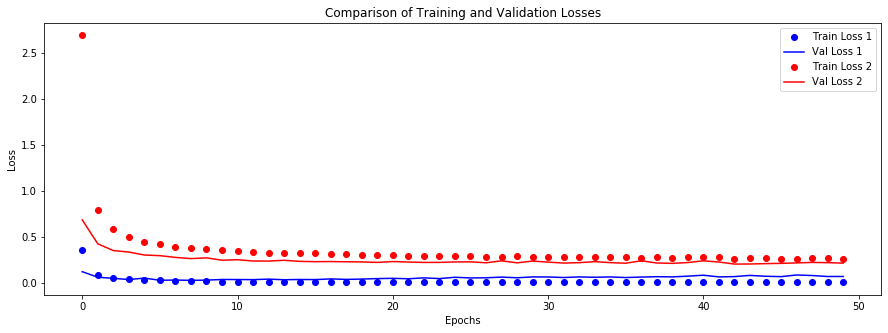

In [23]:
# Compare the losses of three training processes
loss1 = history1.history['loss']
val_loss1 = history1.history['val_loss']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, 'Model 1', 'Model 2')

In [24]:
LABELS= ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

# Define the confusion matrix for the results
def show_confusion_matrix(validations, predictions, num_classes):
    matrix = metrics.confusion_matrix(validations, predictions)
    plt.figure(figsize=(num_classes, num_classes))
    hm = sns.heatmap(matrix,
                cmap='coolwarm',
                linecolor='white',
                linewidths=1,
                xticklabels=LABELS,
                yticklabels=LABELS,
                annot=True,
                fmt='d')
    plt.yticks(rotation = 0)  # Don't rotate (vertically) the y-axis labels
    #hm.invert_yaxis() # Invert the labels of the y-axis
    hm.set_ylim(0, len(matrix))
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

Validation loss: 0.2111791367292404
Validation accuracy: 0.9958000183105469


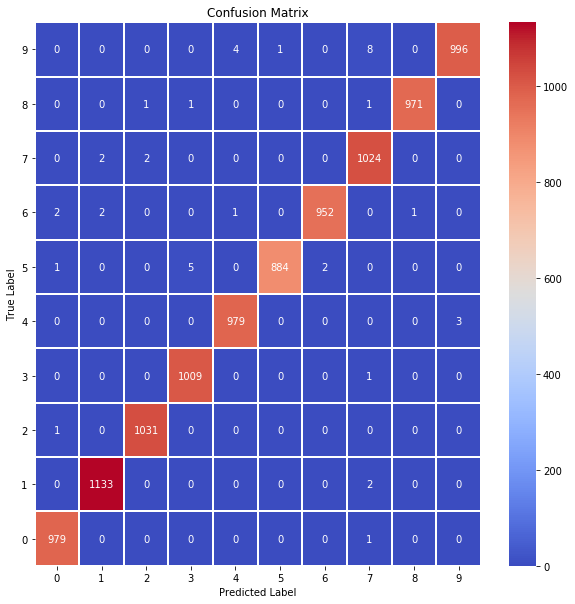

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135
           2       1.00      1.00      1.00      1032
           3       0.99      1.00      1.00      1010
           4       0.99      1.00      1.00       982
           5       1.00      0.99      0.99       892
           6       1.00      0.99      1.00       958
           7       0.99      1.00      0.99      1028
           8       1.00      1.00      1.00       974
           9       1.00      0.99      0.99      1009

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [25]:
# Evaluate the model and print out the final scores for the val set
score = model2.evaluate(x_val, y_val, verbose=0)  # evaluate the model on the val set
print('Validation loss:', score[0])      # print out the loss = score[0] (generalization error) 
print('Validation accuracy:', score[1])  # print out the generalization accuracy = score[1] of the model on val set

# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model2.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  42
Misclassified examples:
[ 359  625  674  716 1039 1232 1393 1681 1737 1878 1901 2035 2040 2130
 2414 2462 2582 2597 3060 3422 3558 3726 3762 4163 4224 4284 4497 4507
 4620 4699 5654 6571 6576 6597 6625 8316 8527 9638 9642 9692 9698 9729]
Misclassified images (original class : predicted class):


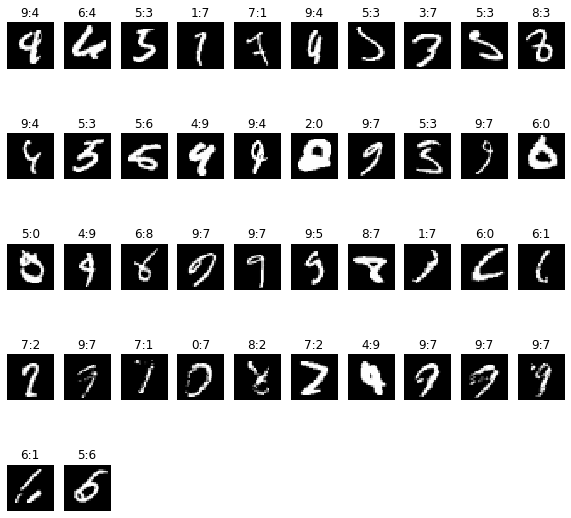

In [26]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]].reshape(img_rows, img_cols)) # index of the val sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

The comparison of results has shown that our second model achieve higher accuracy than the simple model.

You can still try to change hyperparameters of the model and achieve better results!

## CIFAR-10 dataset training and validation example on ConvNet

Let's look at another example of the convolutional neural network used to classify CIFAR-10 data.

Now, we will use RGB images of 32 x 32 pixels and classify them into 10 classes.

Training data consists of 50000 of images, and validating dataset of 10000 of images.

In [27]:
from keras.datasets import cifar10 # gets CIFAR-10 dataset from repository

# Define hyperparameters
num_classes = 10 # number of classes of images

# Input image dimensions
img_rows, img_cols = 32, 32

# Split the data between train and val sets
(x_train, y_train), (x_val, y_val) = cifar10.load_data() # 50000 training and 10000 validating examples

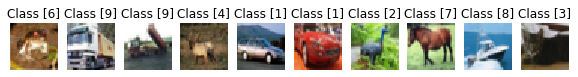

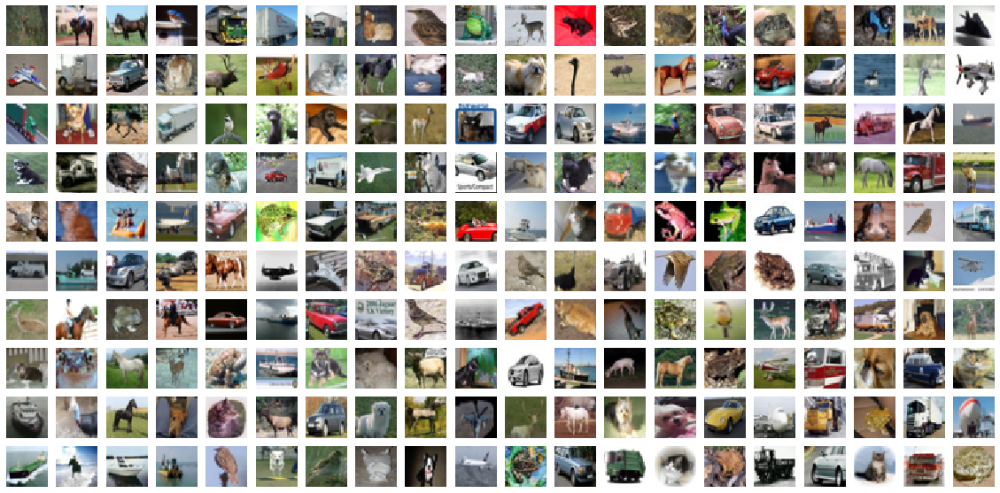

In [28]:
# Show a few sample images from the training set
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()
    
# Show a few sample digits from the training set
plt.rcParams['figure.figsize'] = (1.0, 1.0) # set default size of plots
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

In [29]:
# According to the different formats reshape training and validating data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 3, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 3, img_rows, img_cols)
    input_shape = (3, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 3)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 3)
    input_shape = (img_rows, img_cols, 3)

# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255 # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255  # Transfrom the validating data from the range of 0 and 255 to the range of 0 and 1
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validating samples')

# Convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_val = keras.utils.to_categorical(y_val, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 validating samples


### Create a model for this dataset

In [30]:
# Define the sequential Keras model composed of a few layers
model3 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model3.add(Conv2D(64, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
model3.add(Conv2D(64, (3, 3), activation='relu'))
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.25)) # Implements the drop out with the probability of 0.25
model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
#model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
model3.add(Conv2D(256, (3, 3), activation='relu',padding='same'))
#model3.add(Conv2D(256, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model3.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model3.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model3.add(Dropout(0.5))
model3.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model3.add(Dropout(0.3))
model3.add(Dense(num_classes, activation='softmax'))

# Now print the full model and notice the number of all trainable paramters
print(model2.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 6, 6, 128)        

In [31]:
# Define hyperparameters
batch_size = 512 # size of mini-baches
epochs = 50      # how many times all traing examples will be used to train the model

# Compile the model using optimizer
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=keras.optimizers.Adadelta(),
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

Epoch 1/50
97/97 [==============================] - 150s 2s/step - loss: 3.2728 - acc: 0.1209 - val_loss: 2.9559 - val_acc: 0.2389
Epoch 2/50
97/97 [==============================] - 158s 2s/step - loss: 2.8232 - acc: 0.2086 - val_loss: 2.6113 - val_acc: 0.2743
Epoch 3/50
97/97 [==============================] - 164s 2s/step - loss: 2.5122 - acc: 0.2603 - val_loss: 2.2373 - val_acc: 0.3421
Epoch 4/50
97/97 [==============================] - 162s 2s/step - loss: 2.2422 - acc: 0.3118 - val_loss: 1.9984 - val_acc: 0.3964
Epoch 5/50
97/97 [==============================] - 155s 2s/step - loss: 2.0604 - acc: 0.3499 - val_loss: 2.0067 - val_acc: 0.3689
Epoch 6/50
97/97 [==============================] - 167s 2s/step - loss: 1.9289 - acc: 0.3738 - val_loss: 1.7516 - val_acc: 0.4354
Epoch 7/50
97/97 [==============================] - 160s 2s/step - loss: 1.8226 - acc: 0.4009 - val_loss: 1.6646 - val_acc: 0.4544
Epoch 8/50
97/97 [==============================] - 164s 2s/step - loss: 1.7438 - a

In [32]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_1.h5')

Train loss: 0.5659338885784149
Train accuracy: 0.8405399918556213
Bias: 0.8405399918556213
Validation loss: 0.6622600614547729
Validation accuracy: 0.8083000183105469
Variance: -0.03223997354507446


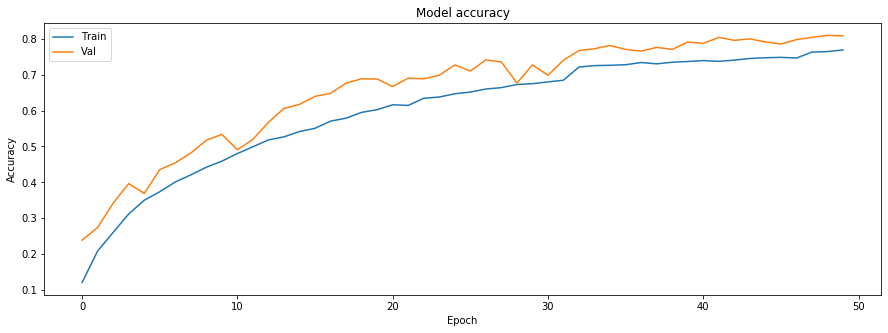

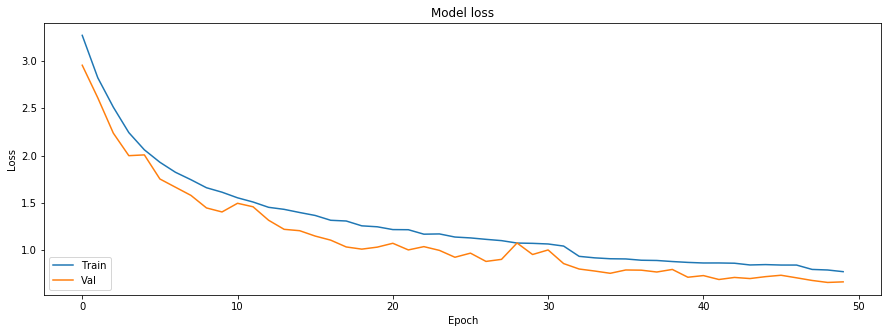

In [37]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

As we can notice, the variance is negative (less than 0). Should we be happy about this? Where it comes from? Mini-batch mode and regularization mechanisms, such as Dropout and L1/L2 weight regularization, are turned off at the validation time, so the model does not change as during the testing time. That is why the training error is always bigger, which can appear weird in view of the classic machine learning models. On the other hand, such calculated variance is not true. We had to calculate it without the turned-on regularization factors and with one batch to be comparable to the error calculated for testing data.

The training and validation errors still decrease, so the training should be continued to achieve probably better results, decreasing bias, which is after 50 epochs not satisfactory!

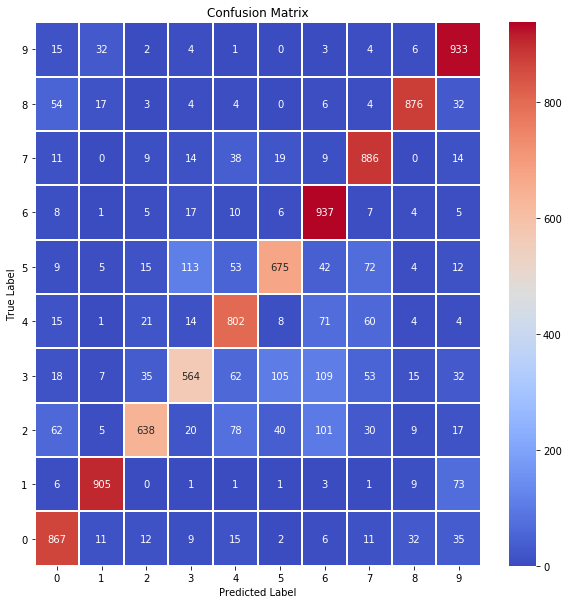

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      1000
           1       0.92      0.91      0.91      1000
           2       0.86      0.64      0.73      1000
           3       0.74      0.56      0.64      1000
           4       0.75      0.80      0.78      1000
           5       0.79      0.68      0.73      1000
           6       0.73      0.94      0.82      1000
           7       0.79      0.89      0.83      1000
           8       0.91      0.88      0.89      1000
           9       0.81      0.93      0.87      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.80     10000
weighted avg       0.81      0.81      0.80     10000



In [34]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  1917
Misclassified examples:
[  12   24   25 ... 9989 9993 9996]
Misclassified images (original class : predicted class):


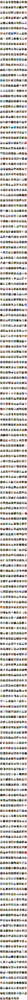

In [35]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

As we could see, training this dataset is not so easy as training the MNIST dataset.

The bias of the model is still high, so the model under fits. However, the variance of the model seems not to be bad; however, we didn't calculate the real variance here, so it can be misleading! So, what do we need to do now with this model to reduce the high bias? Let's learn the same model longer (for another hundred of epochs) and change the mini-batch size from 512 to 256 to give the model the ability not to stack in local minima or saddle points so quickly.

So now we apply __a babysitting model__ (__Panda strategy__) to improve the model performance:

In [38]:
# Define hyperparameters
batch_size = 256  # size of mini-baches
epochs = 100      # how many times all traing examples will be used to train this model further

# Compile the model using optimizer
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=keras.optimizers.Adadelta(),
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

Epoch 1/100
195/195 [==============================] - 173s 889ms/step - loss: 0.9736 - acc: 0.7079 - val_loss: 0.8086 - val_acc: 0.7718
Epoch 2/100
195/195 [==============================] - 173s 886ms/step - loss: 0.9700 - acc: 0.7178 - val_loss: 0.8519 - val_acc: 0.7654
Epoch 3/100
195/195 [==============================] - 169s 865ms/step - loss: 0.9819 - acc: 0.7179 - val_loss: 0.8258 - val_acc: 0.7761
Epoch 4/100
195/195 [==============================] - 170s 869ms/step - loss: 0.9722 - acc: 0.7245 - val_loss: 0.8943 - val_acc: 0.7561
Epoch 5/100
195/195 [==============================] - 172s 880ms/step - loss: 0.9747 - acc: 0.7243 - val_loss: 0.8011 - val_acc: 0.7848
Epoch 6/100
195/195 [==============================] - 166s 852ms/step - loss: 0.9656 - acc: 0.7287 - val_loss: 0.8172 - val_acc: 0.7821
Epoch 7/100
195/195 [==============================] - 167s 854ms/step - loss: 0.9497 - acc: 0.7358 - val_loss: 0.7600 - val_acc: 0.8059
Epoch 8/100
195/195 [====================

In [39]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_2.h5')

Train loss: 0.379984456281662
Train accuracy: 0.896619975566864
Bias: 0.896619975566864
Validation loss: 0.5050123132705688
Validation accuracy: 0.8518999814987183
Variance: -0.04471999406814575


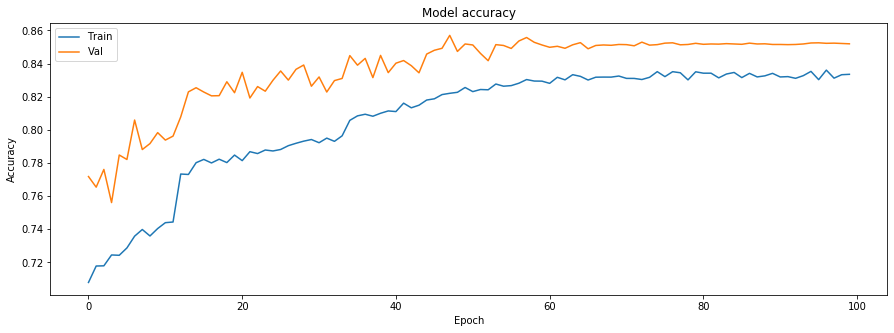

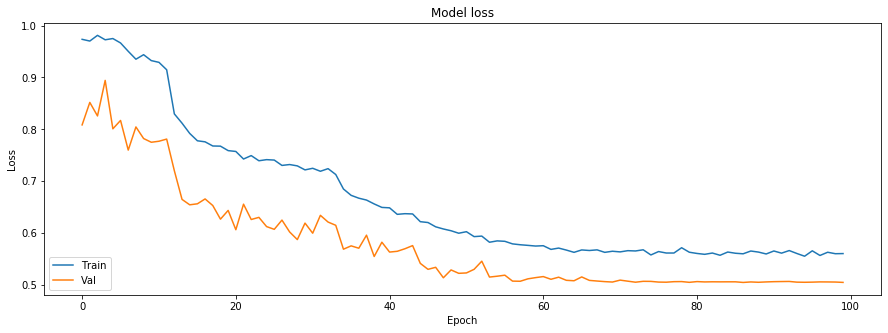

In [40]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

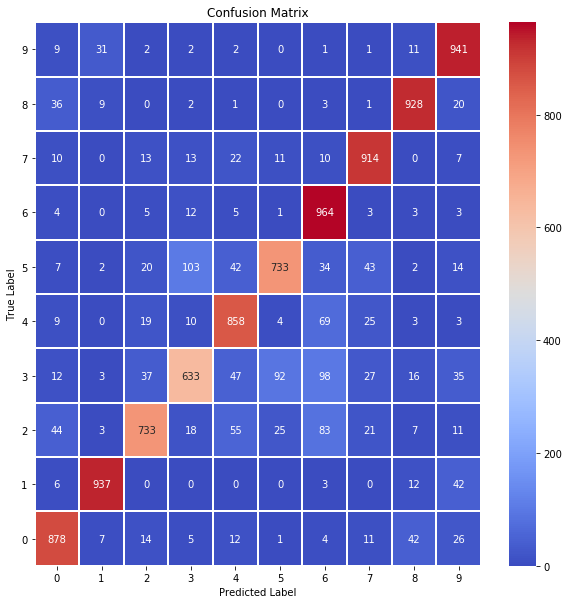

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1000
           1       0.94      0.94      0.94      1000
           2       0.87      0.73      0.80      1000
           3       0.79      0.63      0.70      1000
           4       0.82      0.86      0.84      1000
           5       0.85      0.73      0.79      1000
           6       0.76      0.96      0.85      1000
           7       0.87      0.91      0.89      1000
           8       0.91      0.93      0.92      1000
           9       0.85      0.94      0.90      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



In [41]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  1481
Misclassified examples:
[   3   24   32 ... 9982 9985 9989]
Misclassified images (original class : predicted class):


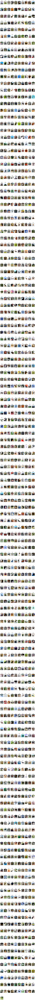

In [42]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

After 100 epochs, we increased the model accuracy from 0.81 to 0.85, so the number of incorrectly classified validation examples dropped about a few hundred. Our model is still not perfect. It's time for you! What do you propose to do with this model to perform better than the presented model? Implement your ideas in the following assignments.

## ASSIGNMENTS

* Copy and paste the above-developed model to the cells below.
* Modify hyperparameters of the model (the structure, the number of layers in the network and the number of filters per convolution layer, dropout parameters etc.) and achieve better accuracy for both models: MNIST and CIFAR-10.
* Reduce the high bias of the CIFAR-10 model, not raising or even still decreasing the model variance.
* Compare accuracy and loss of your model with the previously trained models (PlotTwoAccuracyComparison and PlotTwoLossComparison).
* Try to perform similar experiments on a different training dataset of images, e.g. downloaded from <a href="www.kaggle.com">Kaggle.com</a> or a different source. Create a new CNN model and implement regularizations and other optimization methods trying to decrease bias and variance of the model. 

* Send your developed CNN model as an answer to this assignment on MS Teams.